<a href="https://colab.research.google.com/github/catminh110/LabCPV301/blob/main/Lab12.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Stitching Lab

The Workflow of the Stitching Pipeline can be seen in the following. Note that the image comes from the [OpenCV Documentation](https://docs.opencv.org/3.4/d1/d46/group__stitching.html).

![image stitching pipeline](https://github.com/opencv/opencv/blob/master/modules/stitching/doc/StitchingPipeline.jpg?raw=true)

With the following block, we allow displaying resulting images within the notebook:

## Mục tiêu
- Tải các hình ảnh từ Google Drive.
- Hiển thị hình ảnh trong notebook để dễ dàng theo dõi và phân tích.
- Xác minh số lượng hình ảnh đã được tải.

In [ ]:
# Kết nối Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# thư viện
from matplotlib import pyplot as plt
import cv2 as cv
import numpy as np
from pathlib import Path

# Hàm plt 1 hình ảnh đơn lẻ
def plot_image(img, figsize_in_inches=(5, 5)):
    fig, ax = plt.subplots(figsize=figsize_in_inches)
    ax.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.show()

# Hàm plt nhiều hình ảnh
def plot_images(imgs, figsize_in_inches=(5, 5)):
    fig, axs = plt.subplots(1, len(imgs), figsize=figsize_in_inches)
    for col, img in enumerate(imgs):
        axs[col].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.show()

# Hàm đọc hình
def get_image_paths(drive_path):
    return [str(path) for path in Path(drive_path).rglob('*')]

# Hàm để load các hình
def load_images(image_paths):
    images = []
    for path in image_paths:
        img = cv.imread(path)
        if img is not None:
            images.append(img)
    return images


Tải ảnh và đọc ảnh trong Colab để sử dụng thực hành Lab

In [ ]:
!pip install opencv-python-headless

In [ ]:
def count_images(drive_path):
    image_files = [f for f in os.listdir(drive_path) if f.endswith(('.jpg', '.jpeg', '.png', '.gif'))]
    return len(image_files)

# Cập nhật đường dẫn thư mục chứa ảnh
drive_path = "/content/drive/MyDrive/fpt_imgs"

# Kiểm tra số lượng ảnh
num_images = count_images(drive_path)
print(f"Số lượng ảnh trong thư mục '{drive_path}': {num_images}")


Số lượng ảnh trong thư mục '/content/drive/MyDrive/fpt_imgs': 4


## Resize Images

Bước đầu tiên là thu nhỏ kích thước các hình ảnh xuống độ phân giải trung bình (và sau đó là thấp). Lớp được sử dụng là Images. Nếu các hình ảnh không nên được ghép lại ở độ phân giải đầy đủ, có thể được thực hiện bằng cách đặt tham số final_megapix thành một số lớn hơn 0.

Hàm resizeImagesToMedium sẽ tải từng hình ảnh, thu nhỏ kích thước của chúng xuống độ phân giải trung bình (2MP) bằng cách sử dụng tham số final_megapix, sau đó trả về mảng các hình ảnh đã được thu nhỏ.

`Images.of(images, medium_megapix=0.6, low_megapix=0.1, final_megapix=-1)`

In [ ]:
# cài đặt thư viện stitching
!pip install opencv-contrib-python

# Cài đặt package
!pip install stitching


In [ ]:
from stitching.images import Images
images = Images.of(fpt_imgs)

# chuẩn hóa  kích thước hình ảnh


# LƯU Ý: Mỗi lần gọi list() trong notebook này có nghĩa là hàm trả về một bộ tạo (generator)
# (các bộ tạo cải thiện hiệu suất ghép hình tổng thể). Để lấy tất cả các phần tử cùng một lúc,
# chúng ta sử dụng list(generator_object)  # Chuyển đổi bộ tạo thành danh sách để lấy toàn bộ các phần tử.


SyntaxError: invalid syntax (<ipython-input-68-fd5c4de8fbe4>, line 17)

**LƯU Ý:** Mỗi lần gọi list() trong notebook này có nghĩa là hàm trả về một bộ tạo (generator)
- (các bộ tạo cải thiện hiệu suất ghép hình tổng thể). Để lấy tất cả các phần tử cùng một lúc, sử dụng list(generator_object)
- Chuyển đổi bộ tạo thành danh sách để lấy toàn bộ các phần tử.

# Hiển thị ảnh gốc



In [ ]:
plot_images(low_imgs, (20,20))

NameError: name 'low_imgs' is not defined

## Kiểm tra và in kích thước của hình ảnh sau khi thay đổi độ phân giải

In [ ]:
# xem kích thước của hình ảnh gốc

# xem kích thước của hình ảnh sau khi thay đổi độ phân giải


# In kích thước hình ảnh và số điểm ảnh cho từng độ phân giải



Original Size: (720, 1280)  -> 921,600) px
Medium Size:   (581, 1033)  -> 600,173 px ~ 0.6 MP
Low Size:      (237, 422)   -> 100,014 px ~ 0.1 MP
Final Size:    (720, 1280)  -> 921,600 px ~ 1 MP


## Find Features
Trên các hình ảnh độ phân giải trung bình, chúng ta sẽ tìm các đặc trưng nổi bật có thể xuất hiện ở các hình ảnh khác. Lớp có thể sử dụng là lớp FeatureDetector, khởi tạo đối tượng FeatureDetector sử dụng phương pháp ORB (Oriented FAST and Rotated BRIEF) để phát hiện tối đa 500 đặc trưng nổi bật


`FeatureDetector(detector='orb', nfeatures=500)`

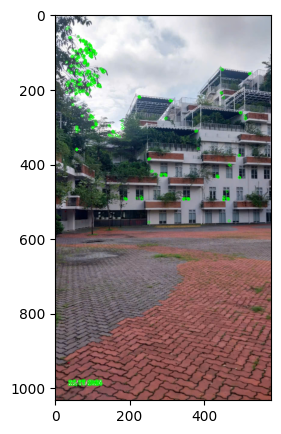

In [ ]:
from stitching.feature_detector import FeatureDetector

# Khởi tạo FeatureDetector với 'orb' và 500 đặc trưng


# Phát hiện đặc trưng trên mỗi ảnh trong medium_imgs


# Vẽ đặc trưng trên ảnh thứ hai trong danh sách medium_imgs


# in ảnh đã vẽ các đặc trưng
plot_image(keypoints_center_img)


- Phát hiện đặc trưng (Feature Detection)
- Trực quan hóa đặc trưng (Keypoint Visualization)

In [ ]:
from stitching.feature_detector import FeatureDetector


# # Phát hiện các đặc trưng (features) cho từng ảnh trong danh sách


# Vẽ các điểm đặc trưng (keypoints) lên ảnh thứ hai trong danh sác


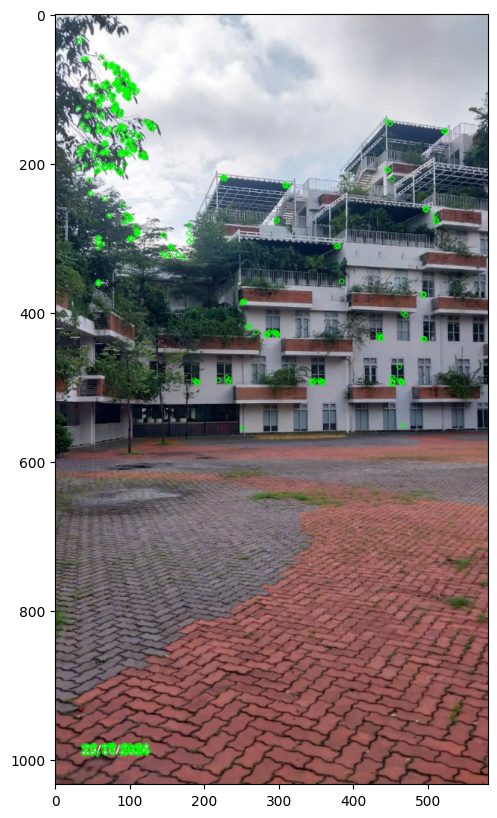

In [ ]:
plot_image(keypoints_center_img, (15,10))

## Match Features

so khớp các đặc trưng (feature matching) giữa các ảnh
# Khởi tạo FeatureMatcher với 'homography' và range_width là -1

`FeatureMatcher(matcher_type='homography', range_width=-1)`

In [ ]:
from stitching.feature_matcher import FeatureMatcher

# Khởi tạo FeatureMatcher với 'homography' và range_width là -1


# # Thực hiện ghép nối (matching) các đặc trưng giữa các ảnh trong danh sách


We can look at the confidences, which are calculated by:

`confidence = number of inliers / (8 + 0.3 * number of matches)`
The inliers are calculated using the random sample consensus (RANSAC) method

In [ ]:
# tìm ma trận độ tin cậy cho các matches


# In ra ma trận độ tin cậy
print("Confidence Matrix:")
print(confidence_matrix)


Confidence Matrix:
[[0.         1.25523013 0.41958042 1.98300283]
 [1.25523013 0.         0.40983607 0.37383178]
 [0.41958042 0.40983607 0.         0.37313433]
 [1.98300283 0.37383178 0.37313433 0.        ]]


It can be seen that:

- image 1 has a high matching confidence with image 2 and low confidences with image 3 and 4
- image 2 has a high matching confidence with image 1 and image 3 and low confidences with image 4
- image 3 has a high matching confidence with image 2 and low confidences with image 1 and 4
- image 4 has low matching confidences with image 1, 2 and 3

With a `confidence_threshold`, which is introduced in detail in the next step, we can plot the relevant matches with the inliers:

Matches Image 1 to Image 2


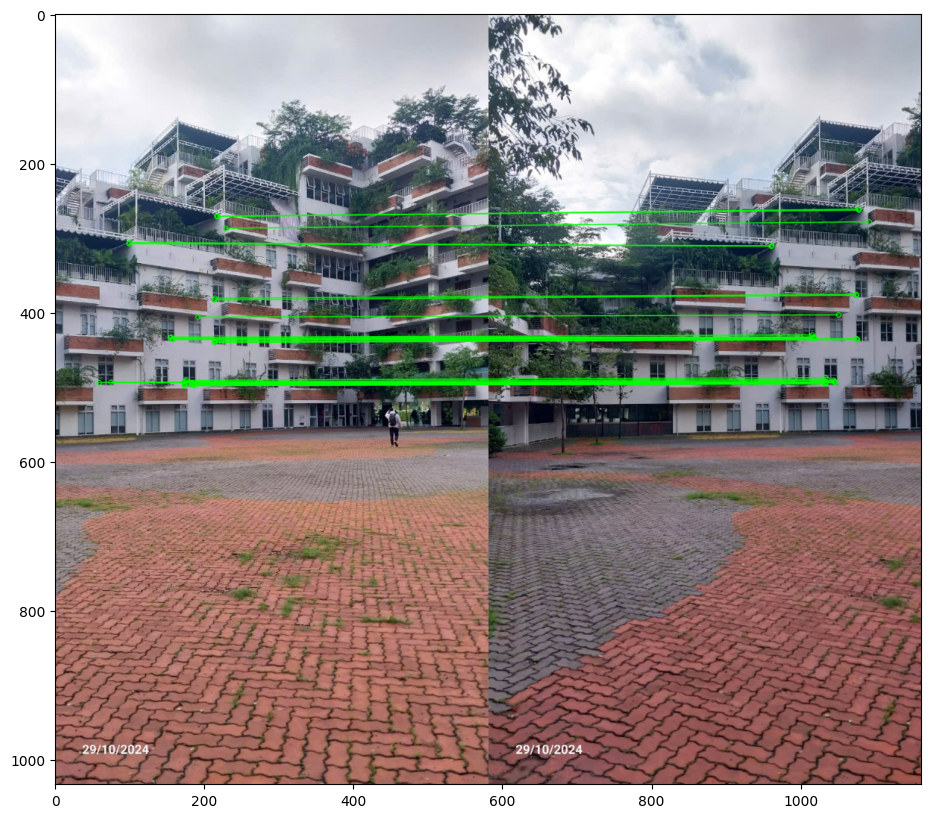

Matches Image 1 to Image 4


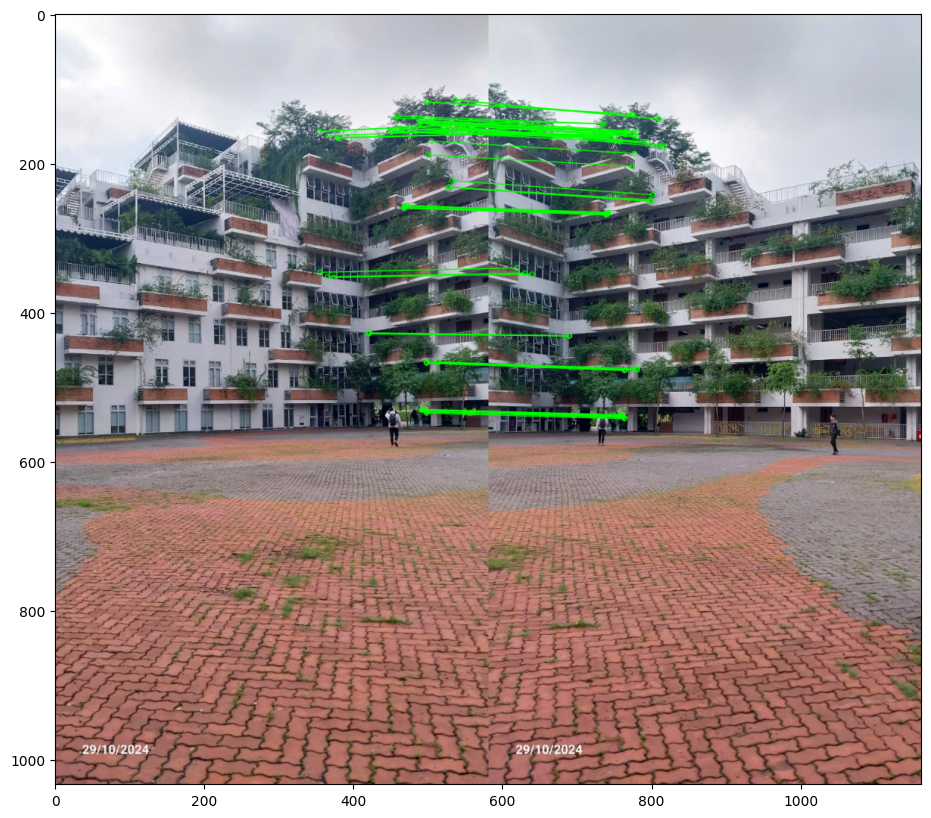

In [ ]:
# Vẽ và hiển thị tất cả các cặp ảnh với ngưỡng độ tin cậy đã điều chỉnh

# Duyệt qua và hiển thị kết quả cho tất cả các cặp ảnh


## Subset

Above we saw that the noise image has no connection to the other images which are part of the panorama. We now want to create a subset with only the relevant images. The class which can be used is the `Subsetter` class. We can specify the `confidence_threshold` from when a match is regarded as good match. We saw that in our case `1` is sufficient. For the parameter `matches_graph_dot_file` a file name can be passed, in which a matches graph in dot notation is saved.

`Subsetter(confidence_threshold=1, matches_graph_dot_file=None)`

In [ ]:
from stitching.subsetter import Subsetter

subsetter = Subsetter()
# trực  mối quan hệ ghép nối giữa các ảnh thông qua biểu đồ DOT


graph matches_graph{
"1" -- "2"[label="Nm=53, Ni=30, C=1.25523"];
"1" -- "4"[label="Nm=91, Ni=70, C=1.983"];
"3";
}


The matches graph visualizes what we've saw in the confidence matrix: image 1 conneced to image 2 conneced to image 3. Image 4 is not part of the panorama (note that the confidences can vary since this is a static image).

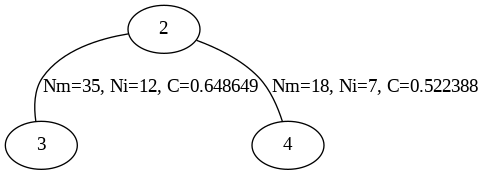

[GraphvizOnline](https://dreampuf.github.io/GraphvizOnline) is used to plot the graph

We now want to subset all variables we've created till here, incl. the attributes `img_names` and `img_sizes` of the `ImageHandler`

In [ ]:
!apt-get install graphviz
!pip install graphviz


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
graphviz is already the newest version (2.42.2-6ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 29 not upgraded.


In [ ]:
from stitching.subsetter import Subsetter

# Khởi tạo Subsetter với ngưỡng độ tin cậy


# Tạo đồ thị khớp nối
 # In ra đồ thị khớp nối

# Lấy các chỉ số của các ảnh cần giữ lại


# Tạo tập con cho các ảnh và đặc trưng


# Cập nhật danh sách ảnh trong đối tượng images
images.subset(indices)

# In ra tên các ảnh trong tập con
print(images.names)

# In ma trận độ tin cậy của các khớp nối
print(matcher.get_confidence_matrix(matches))


graph matches_graph{
"1" -- "2"[label="Nm=53, Ni=30, C=1.25523"];
"1" -- "4"[label="Nm=91, Ni=70, C=1.983"];
"3";
}
['1', '2', '4']
[[0.         1.25523013 1.98300283]
 [1.25523013 0.         0.37383178]
 [1.98300283 0.37383178 0.        ]]


Loại bỏ các ảnh không liên quan (như ảnh nhiễu) và giữ lại chỉ các ảnh phù hợp để ghép thành panorama.

In [ ]:
# Sử dụng get_indices_to_keep để xác định các chỉ số của ảnh có liên quan từ danh sách đặc trưng (features) và ghép nối (matches)
indices = subsetter.get_indices_to_keep(features, matches)

# Lọc danh sách medium_imgs để chỉ giữ lại các ảnh tương ứng với chỉ số trong indices


# cập nhật danh sách ảnh theo indices
images.subset(indices)

print(images.names)
print(matcher.get_confidence_matrix(matches))

['1', '2', '4']
[[0.         1.25523013 1.98300283]
 [1.25523013 0.         0.37383178]
 [1.98300283 0.37383178 0.        ]]


## Camera Estimation, Adjustion and Correction

With the features and matches we now want to calibrate cameras which can be used to warp the images so they can be composed correctly. The classes which can be used are `CameraEstimator`, `CameraAdjuster` and `WaveCorrector`:


```
# Các lớp có thể sử dụng để thực hiện các nhiệm vụ này bao gồm:
- CameraEstimator: Được sử dụng để tính toán các tham số camera dựa trên đặc trưng và so khớp.
- CameraAdjuster: Dùng để điều chỉnh các tham số camera, giúp tối ưu hóa độ chính xác của ghép nối hình ảnh.
- WaveCorrector: Thực hiện hiệu chỉnh lại hình ảnh nhằm giảm các hiện tượng biến dạng trong quá trình ghép nối.
```


```
CameraEstimator(estimator='homography')
CameraAdjuster(adjuster='ray', refinement_mask='xxxxx')
WaveCorrector(wave_correct_kind='horiz')
```

In [ ]:
print(matches)


[< cv2.detail.MatchesInfo 0x78e15c1e7c30>, < cv2.detail.MatchesInfo 0x78e15c1e7b70>, < cv2.detail.MatchesInfo 0x78e15c1e7db0>, < cv2.detail.MatchesInfo 0x78e15c1e7cf0>, < cv2.detail.MatchesInfo 0x78e15c1e7f30>, < cv2.detail.MatchesInfo 0x78e15c1e6df0>, < cv2.detail.MatchesInfo 0x78e15c1e6c70>, < cv2.detail.MatchesInfo 0x78e15c1e6970>, < cv2.detail.MatchesInfo 0x78e15c1e79f0>]


In [ ]:
from stitching.camera_estimator import CameraEstimator
from stitching.camera_adjuster import CameraAdjuster
from stitching.camera_wave_corrector import WaveCorrector




## Warp Images

With the obtained cameras we now want to warp the images itself into the final plane. The class which can be used is the `Warper` class:

`Warper(warper_type='spherical', scale=1)`

In [ ]:
from stitching.warper import Warper



At first, we set the the medium focal length of the cameras as scale:

Warp low resolution images

In [ ]:
low_sizes = images.get_scaled_img_sizes(Images.Resolution.LOW)
 # since cameras were obtained on medium imgs


Warp final resolution images

We can plot the results. Not much scaling and rotating is needed to align the images. Thus, the images are only slightly adjusted in this example

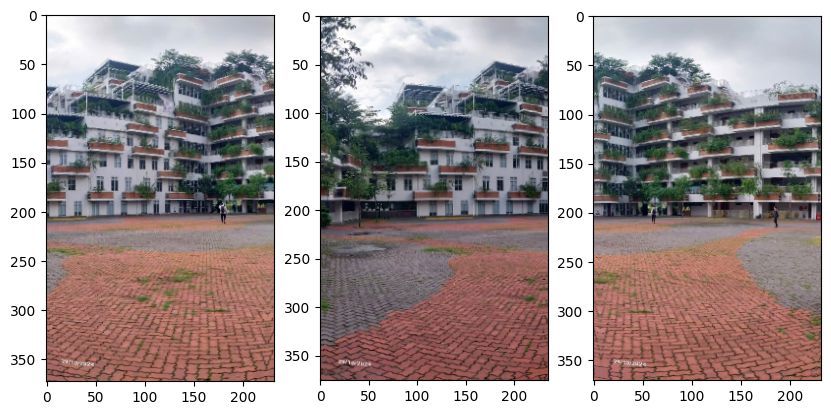

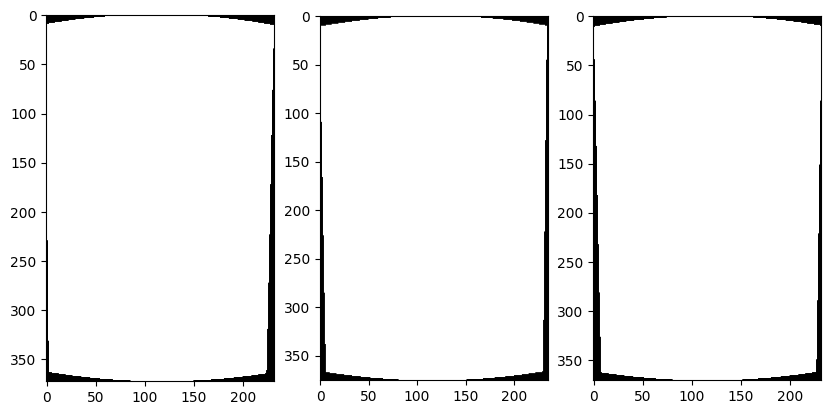

In [ ]:
plot_images(warped_low_imgs, (10,10))
plot_images(warped_low_masks, (10,10))

With the warped corners and sizes we know where the images will be placed on the final plane:

In [ ]:
print(final_corners)
print(final_sizes)

[(-363, 914), (-715, 912), (16, 910)]
[(706, 1131), (713, 1140), (706, 1124)]


## Excursion: Timelapser

The Timelapser functionality is a nice way to grasp how the images are warped into a final plane. The class which can be used is the `Timelapser` class:

`Timelapser(timelapse='no')`

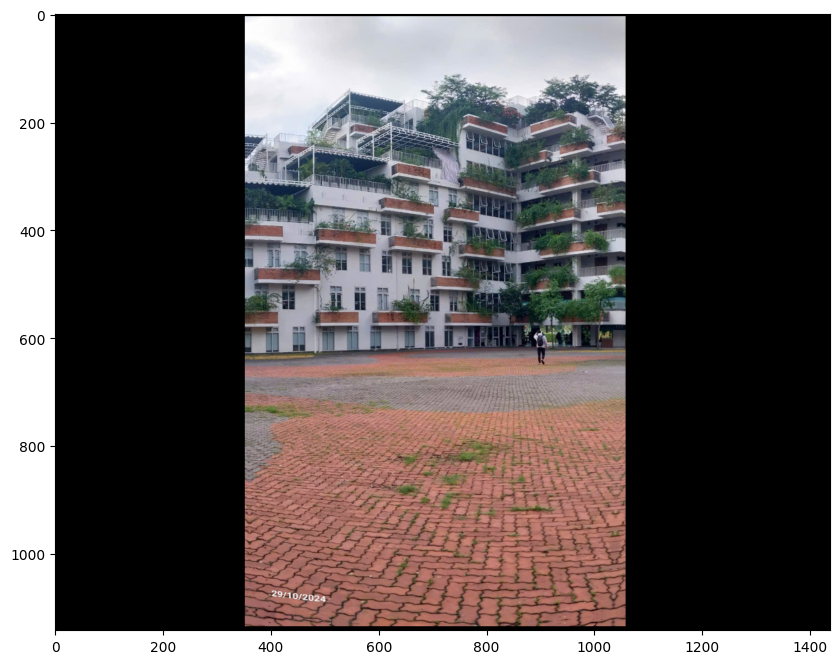

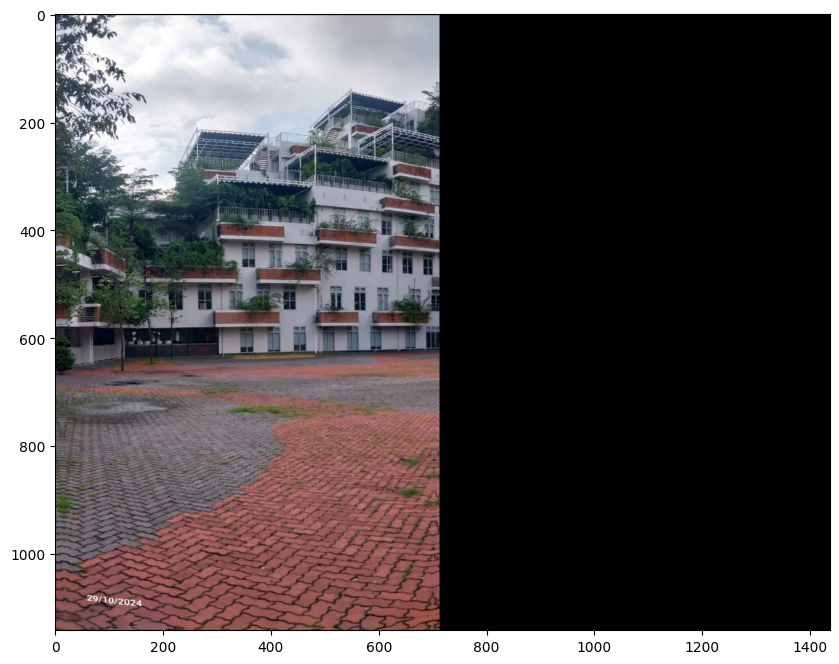

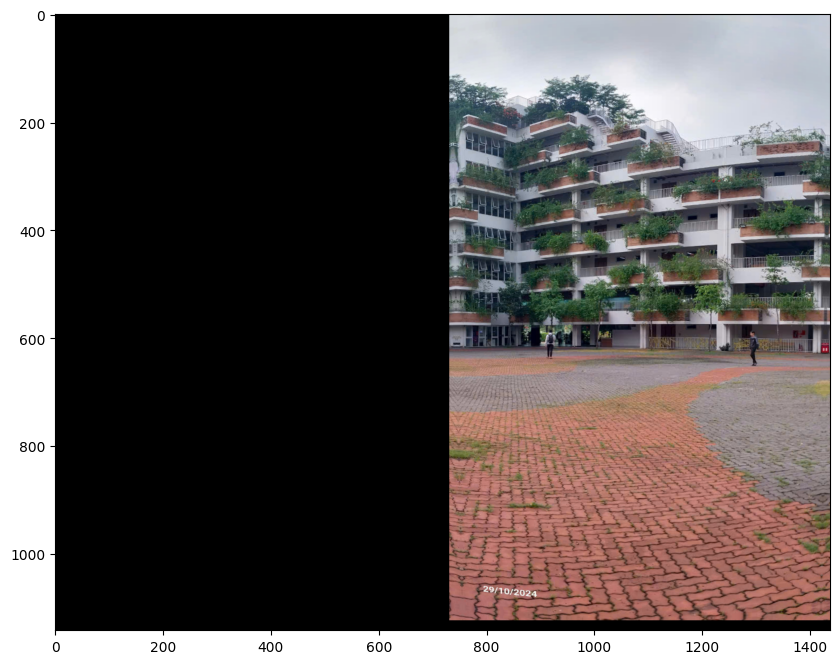

In [ ]:
from stitching.timelapser import Timelapser



## Crop

We can see that none of the images have the full height of the final plane. To get a panorama without black borders we can now estimate the largest joint interior rectangle and crop the single images accordingly. The class which can be used is the `Cropper` class:

`Cropper(crop=True)`

In [ ]:
from stitching.cropper import Cropper



We can estimate a panorama mask of the potential final panorama (using a Blender which will be introduced later)

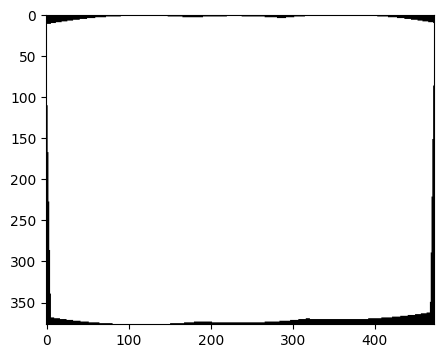

In [ ]:

plot_image(mask, (5,5))

lir = cropper.estimate_largest_interior_rectangle(mask)

After compilation the estimation is really fast:

In [ ]:

print(lir)

Rectangle(x=6, y=11, width=461, height=352)


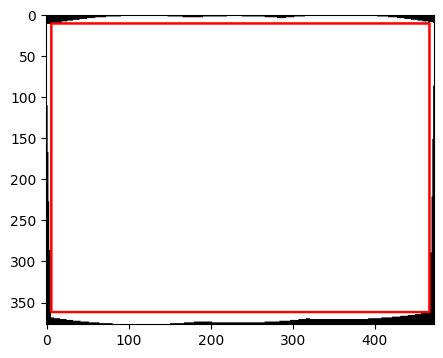

In [ ]:

plot_image(plot, (5,5))

By zero centering the the warped corners, the rectangle of the images within the final plane can be determined. Here the center image is shown:

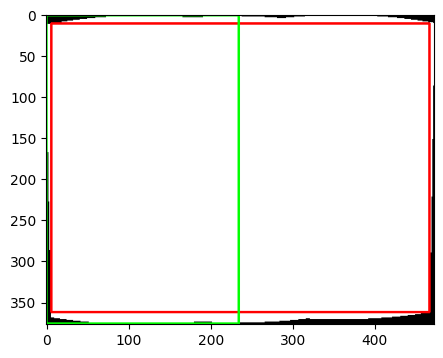

In [ ]:


plot = rectangles[1].draw_on(plot, (0, 255, 0), 2)  # The rectangle of the center img
plot_image(plot, (5,5))

Using the overlap new corners and sizes can be determined:

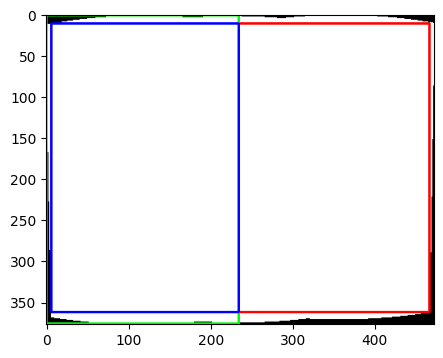

In [ ]:

plot = overlap.draw_on(plot, (255, 0, 0), 2)
plot_image(plot, (5,5))

With the blue Rectangle in the coordinate system of the original image (green) we are able to crop it

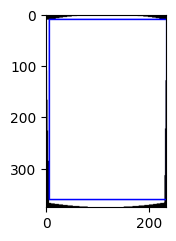

In [ ]:

plot = intersection.draw_on(warped_low_masks[1], (255, 0, 0), 2)
plot_image(plot, (2.5,2.5))

Using all this information we can crop the images and masks and obtain new corners and sizes

In [ ]:
cropper.prepare(warped_low_imgs, warped_low_masks, low_corners, low_sizes)



lir_aspect = images.get_ratio(Images.Resolution.LOW, Images.Resolution.FINAL)  # since lir was obtained on low imgs


Redo the timelapse with cropped Images:

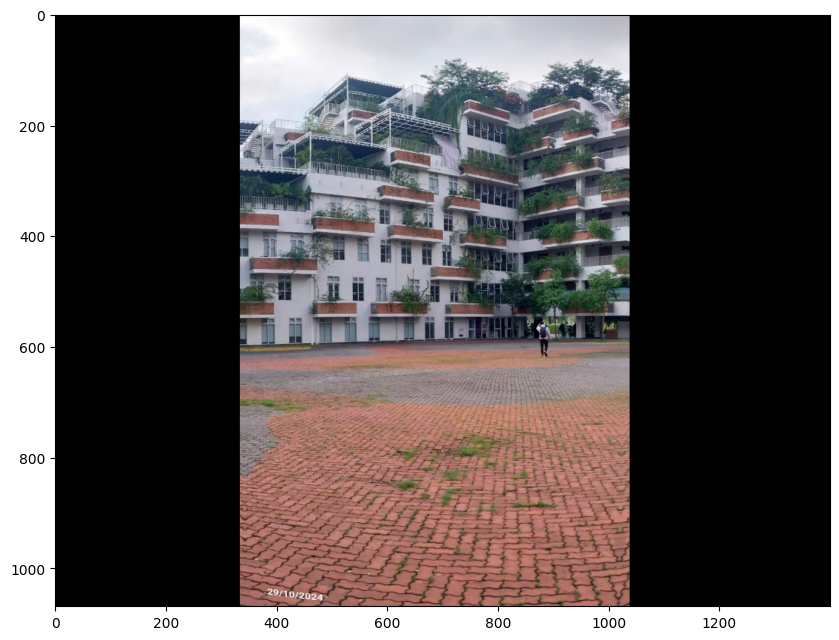

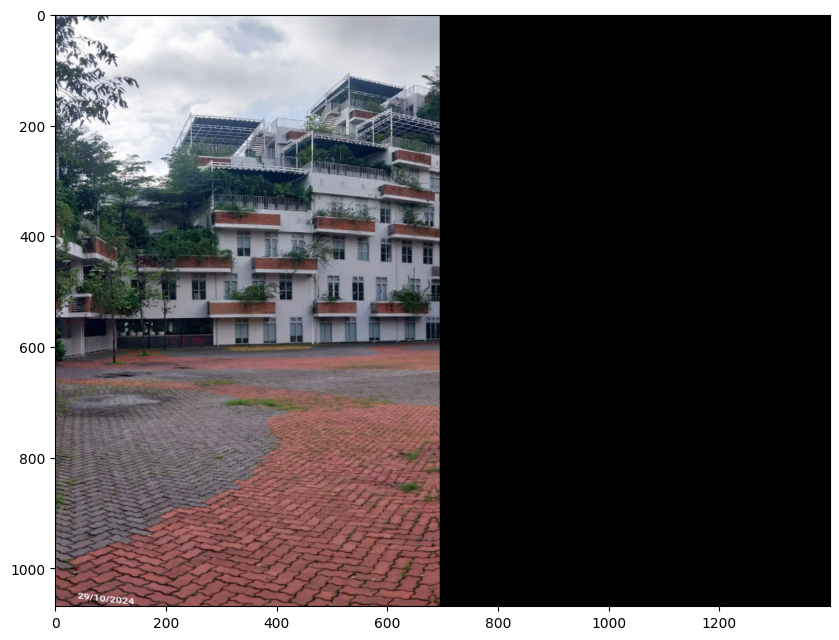

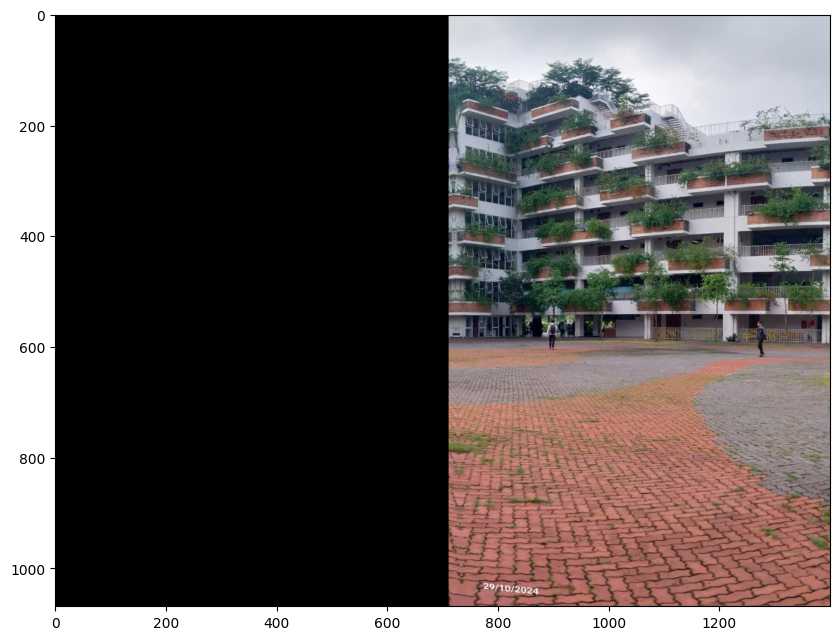

In [ ]:
timelapser = Timelapser('as_is')
timelapser.initialize(final_corners, final_sizes)



Now we need stategies how to compose the already overlaying images into one panorama image. Strategies are:

- Seam Masks
- Exposure Error Compensation
- Blending

## Seam Masks

Seam masks find a transition line between images with the least amount of interference. The class which can be used is the `SeamFinder` class:

`SeamFinder(finder='dp_color')`

The Seams are obtained on the warped low resolution images and then resized to the warped final resolution images. The Seam Masks can be used in the Blending step to specify how the images should be composed.

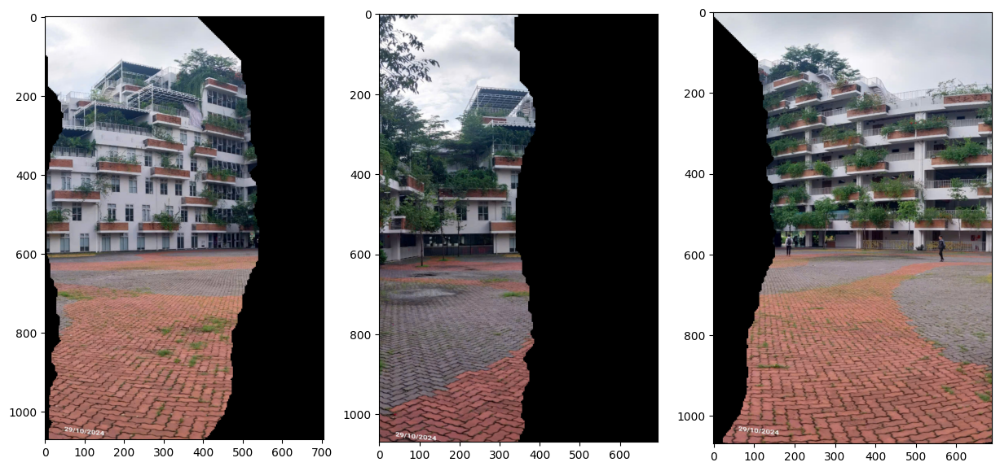

In [ ]:
from stitching.seam_finder import SeamFinder


plot_images(seam_masks_plots, (15,10))

## Exposure Error Compensation

Frequently exposure errors respectively exposure differences between images occur which lead to artefacts in the final panorama. The class which can be used is the `ExposureErrorCompensator` class:

`ExposureErrorCompensator(compensator='gain_blocks', nr_feeds=1, block_size=32)`

The Exposure Error are estimated on the warped low resolution images and then applied on the warped final resolution images.

**Note:** In this example the compensation has nearly no effect and the result is not shown. To understand the stitching pipeline they are compensated anyway. A fitting example for images where Exposure Error Compensation is important can be found at the end of the notebook.   

In [ ]:
from stitching.exposure_error_compensator import ExposureErrorCompensator



## Blending

With all the previous processing the images can finally be blended to a whole panorama. The class which can be used is the `Blender` class:

`Blender(blender_type='multiband', blend_strength=5)`

The blend strength thereby specifies on which overlap the images should be overlayed along the transitions of the masks. This is also visualized at the end of the notebook.

In [ ]:
from stitching.blender import Blender



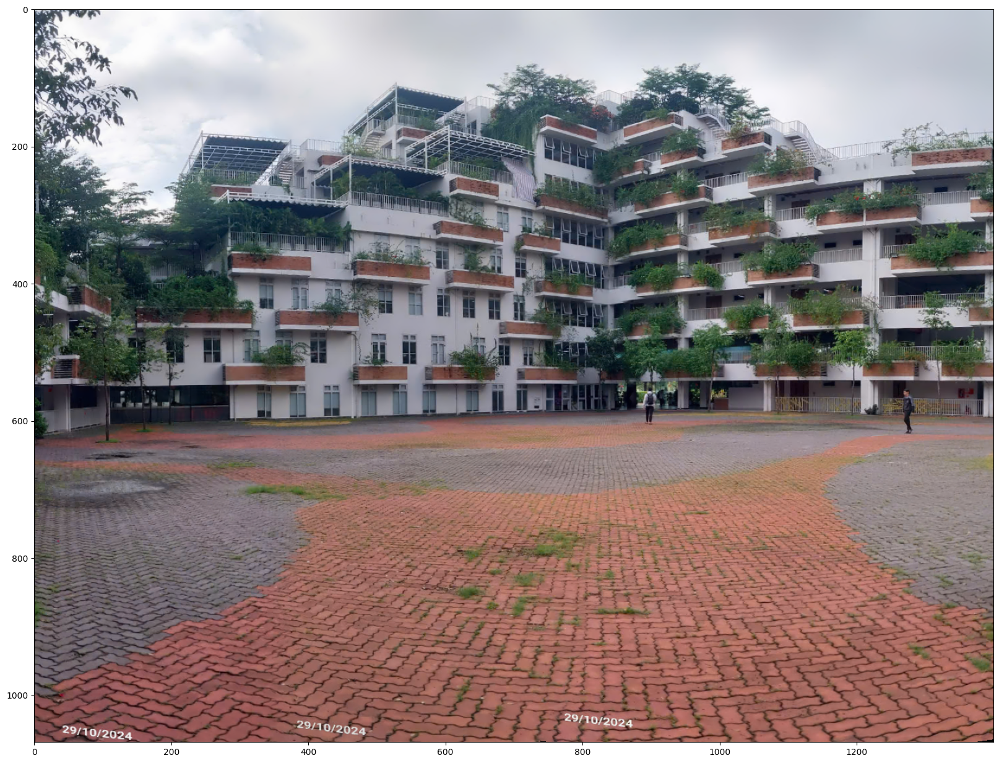

In [ ]:
plot_image(panorama, (20,20))

There is the functionality to plot the seams as lines or polygons onto the final panorama to see which part of the panorama is from which image. The basis is to blend single colored dummy images with the obtained seam masks and panorama dimensions:

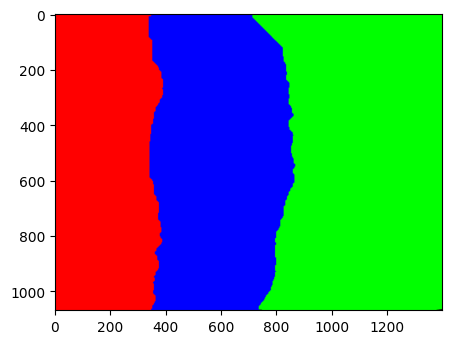

In [ ]:

plot_image(blended_seam_masks, (5,5))

This blend can be converted into lines or weighted on top of the resulting panorama:

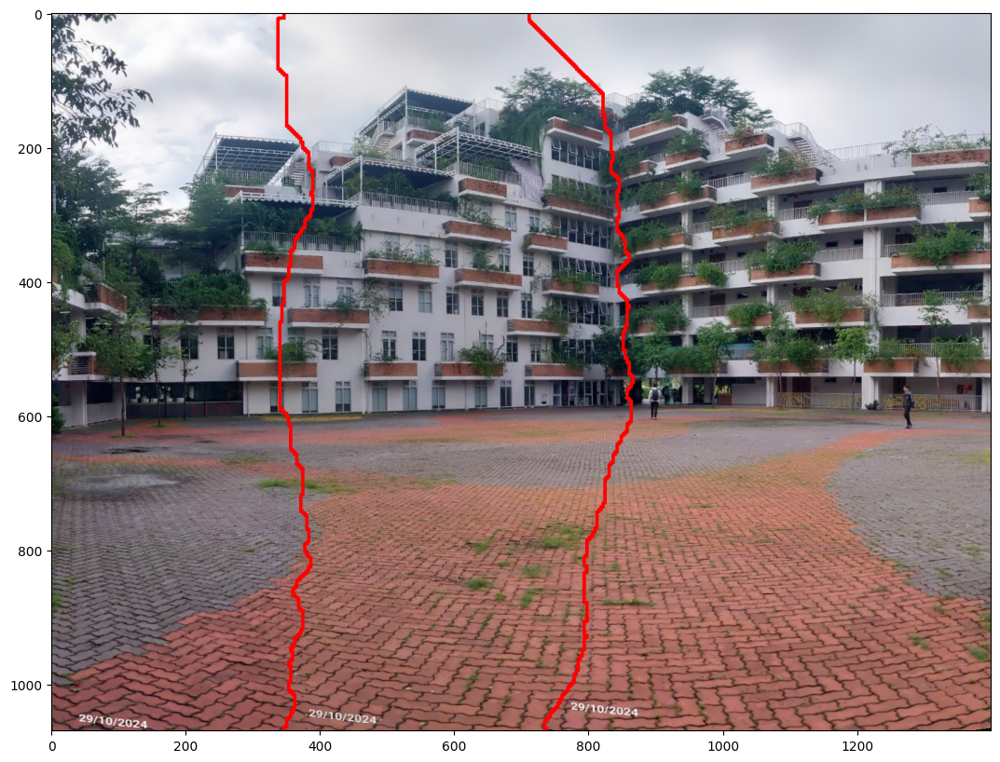

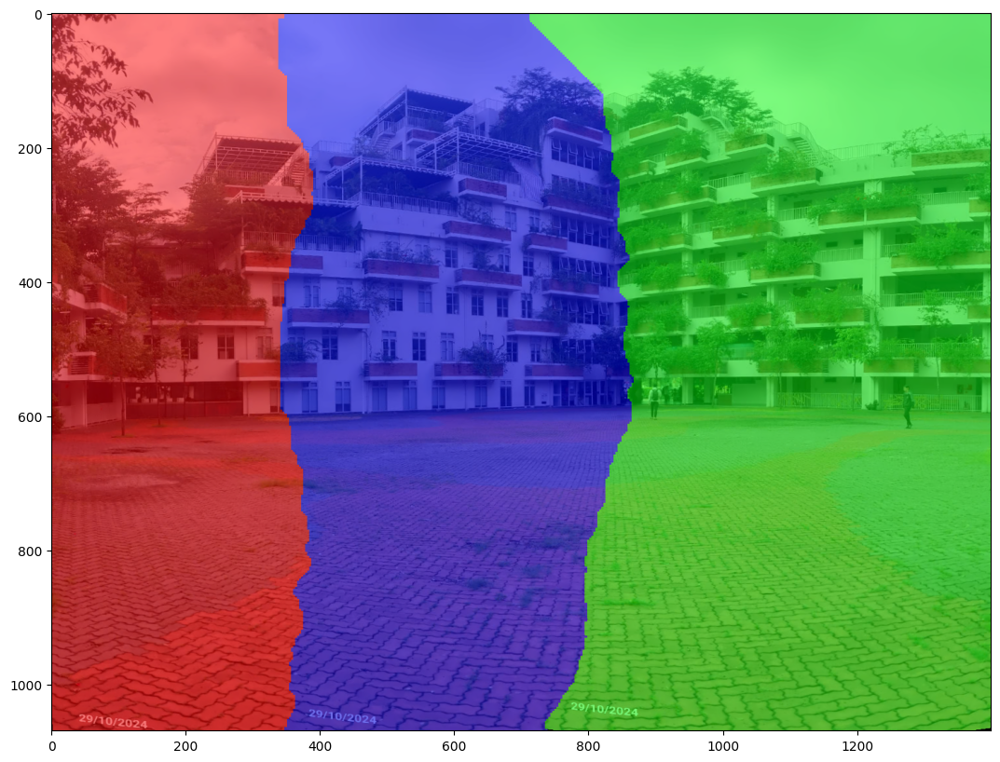

In [ ]:
plot_image(seam_finder.draw_seam_lines(panorama, blended_seam_masks, linesize=3), (15,10))
plot_image(seam_finder.draw_seam_polygons(panorama, blended_seam_masks), (15,10))

# Stitcher

All the functionality above is automated within the `Stitcher` class:

`Stitcher(**kwargs)`

In [ ]:
from stitching import Stitcher


panorama = stitcher.stitch(fpt_imgs)  # the user is warned that only a subset of input images is stitched

/usr/local/lib/python3.11/dist-packages/stitching/subsetter.py:32: StitchingWarning: Not all images are included in the final panorama. If this is not intended, use the 'matches_graph_dot_file' parameter to analyze your matches. You might want to lower the 'confidence_threshold' or try another 'detector' to include all your images.
  warnings.warn(


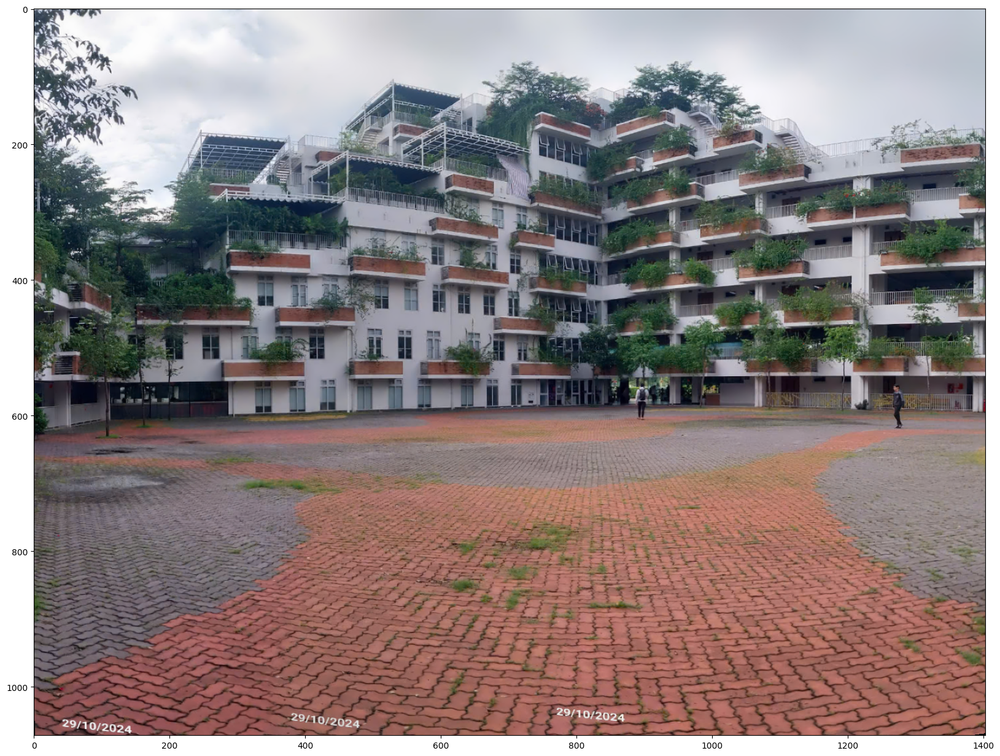

In [ ]:
plot_image(panorama, (20,20))